# 1. Importing the dependencies

In [1]:
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt
import numpy as np
import plotly.graph_objects as go
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

# 2. Importing the dataset

In [2]:
df = pd.read_csv("data/fetal_health.csv")
df.head()

,baseline value,accelerations,fetal_movement,uterine_contractions,light_decelerations,severe_decelerations,prolongued_decelerations,abnormal_short_term_variability,mean_value_of_short_term_variability,percentage_of_time_with_abnormal_long_term_variability,...,histogram_min,histogram_max,histogram_number_of_peaks,histogram_number_of_zeroes,histogram_mode,histogram_mean,histogram_median,histogram_variance,histogram_tendency,fetal_health
0,120.0,0.000,0.0,0.000,0.000,0.0,0.0,73.0,0.5,43.0,...,62.0,126.0,2.0,0.0,120.0,137.0,121.0,73.0,1.0,2.0
1,132.0,0.006,0.0,0.006,0.003,0.0,0.0,17.0,2.1,0.0,...,68.0,198.0,6.0,1.0,141.0,136.0,140.0,12.0,0.0,1.0
2,133.0,0.003,0.0,0.008,0.003,0.0,0.0,16.0,2.1,0.0,...,68.0,198.0,5.0,1.0,141.0,135.0,138.0,13.0,0.0,1.0
3,134.0,0.003,0.0,0.008,0.003,0.0,0.0,16.0,2.4,0.0,...,53.0,170.0,11.0,0.0,137.0,134.0,137.0,13.0,1.0,1.0
4,132.0,0.007,0.0,0.008,0.000,0.0,0.0,16.0,2.4,0.0,...,53.0,170.0,9.0,0.0,137.0,136.0,138.0,11.0,1.0,1.0


# 3. Data cleaning

## How many rows and columns are in the dataset

In [3]:
df.shape

print(f"There are {df.shape[0]} rows and {df.shape[1]} columns.")

There are 2126 rows and 22 columns.


## Finding any duplicates

In [4]:
# Finding any duplicates in the dataset
duplicates = df[df.duplicated()]
print(f"There are {len(duplicates)} duplicates in the dataset.")

There are 13 duplicates in the dataset.


In [5]:
duplicates

,baseline value,accelerations,fetal_movement,uterine_contractions,light_decelerations,severe_decelerations,prolongued_decelerations,abnormal_short_term_variability,mean_value_of_short_term_variability,percentage_of_time_with_abnormal_long_term_variability,...,histogram_min,histogram_max,histogram_number_of_peaks,histogram_number_of_zeroes,histogram_mode,histogram_mean,histogram_median,histogram_variance,histogram_tendency,fetal_health
68,140.0,0.007,0.000,0.004,0.0,0.0,0.0,34.0,1.2,0.0,...,119.0,179.0,2.0,0.0,156.0,153.0,155.0,5.0,0.0,1.0
234,123.0,0.000,0.000,0.000,0.0,0.0,0.0,49.0,0.8,7.0,...,63.0,137.0,2.0,0.0,129.0,127.0,129.0,2.0,1.0,1.0
306,145.0,0.000,0.020,0.000,0.0,0.0,0.0,77.0,0.2,45.0,...,129.0,150.0,1.0,0.0,146.0,145.0,147.0,0.0,1.0,2.0
324,135.0,0.000,0.000,0.000,0.0,0.0,0.0,62.0,0.5,71.0,...,71.0,168.0,3.0,0.0,143.0,142.0,144.0,1.0,1.0,3.0
333,144.0,0.000,0.019,0.000,0.0,0.0,0.0,76.0,0.4,61.0,...,71.0,152.0,3.0,0.0,145.0,144.0,146.0,2.0,1.0,2.0
787,123.0,0.003,0.003,0.000,0.0,0.0,0.0,52.0,0.8,2.0,...,50.0,140.0,7.0,0.0,129.0,128.0,130.0,4.0,1.0,1.0
791,123.0,0.003,0.004,0.000,0.0,0.0,0.0,50.0,0.9,4.0,...,58.0,140.0,7.0,0.0,129.0,128.0,130.0,5.0,1.0,1.0
798,146.0,0.000,0.000,0.003,0.0,0.0,0.0,65.0,0.4,39.0,...,137.0,156.0,1.0,0.0,150.0,149.0,151.0,1.0,1.0,2.0
849,138.0,0.002,0.000,0.004,0.0,0.0,0.0,41.0,0.8,8.0,...,105.0,156.0,4.0,0.0,142.0,142.0,143.0,2.0,1.0,1.0
1113,122.0,0.000,0.000,0.000,0.0,0.0,0.0,19.0,1.9,0.0,...,103.0,142.0,1.0,0.0,120.0,120.0,122.0,3.0,0.0,1.0


In [6]:
# dropping the duplicates
df = df.drop_duplicates()

# new length of the dataset
nrows, ncols = df.shape
print(f"There are {nrows} rows and {ncols} columns in the dataset.")

There are 2113 rows and 22 columns in the dataset.


## Finding any null values


In [7]:
# Are there any null values in the dataset
df.isnull().sum()

baseline value                                            0
accelerations                                             0
fetal_movement                                            0
uterine_contractions                                      0
light_decelerations                                       0
severe_decelerations                                      0
prolongued_decelerations                                  0
abnormal_short_term_variability                           0
mean_value_of_short_term_variability                      0
percentage_of_time_with_abnormal_long_term_variability    0
mean_value_of_long_term_variability                       0
histogram_width                                           0
histogram_min                                             0
histogram_max                                             0
histogram_number_of_peaks                                 0
histogram_number_of_zeroes                                0
histogram_mode                          

# Datatypes of each column

In [8]:
# Finding the current datatypes of each column
df.dtypes.to_frame("Datatype")

,Datatype
baseline value,float64
accelerations,float64
fetal_movement,float64
uterine_contractions,float64
light_decelerations,float64
severe_decelerations,float64
prolongued_decelerations,float64
abnormal_short_term_variability,float64
mean_value_of_short_term_variability,float64
percentage_of_time_with_abnormal_long_term_variability,float64


## Finding the number of unique values in each column

In [9]:
# Finding the number of unique values in each column
df.nunique().to_frame("Unique Values")

,Unique Values
baseline value,48
accelerations,20
fetal_movement,102
uterine_contractions,16
light_decelerations,16
severe_decelerations,2
prolongued_decelerations,6
abnormal_short_term_variability,75
mean_value_of_short_term_variability,57
percentage_of_time_with_abnormal_long_term_variability,87


# 4. EDA

## Data distribution

In [10]:
# casting all the columns with datatype of float64 and int64 to a variable called numerical columns
numerical_cols = df[df.columns[(df.dtypes == "float64") | (df.dtypes == "int64")]]
numerical_cols.sample(5)

,baseline value,accelerations,fetal_movement,uterine_contractions,light_decelerations,severe_decelerations,prolongued_decelerations,abnormal_short_term_variability,mean_value_of_short_term_variability,percentage_of_time_with_abnormal_long_term_variability,...,histogram_min,histogram_max,histogram_number_of_peaks,histogram_number_of_zeroes,histogram_mode,histogram_mean,histogram_median,histogram_variance,histogram_tendency,fetal_health
288,144.0,0.000,0.009,0.000,0.0,0.0,0.0,58.0,0.6,1.0,...,125.0,164.0,3.0,0.0,143.0,142.0,144.0,1.0,0.0,1.0
339,133.0,0.000,0.000,0.000,0.0,0.0,0.0,73.0,0.2,88.0,...,131.0,139.0,1.0,0.0,133.0,134.0,135.0,0.0,0.0,3.0
805,146.0,0.000,0.000,0.001,0.0,0.0,0.0,50.0,0.6,31.0,...,120.0,163.0,3.0,0.0,160.0,155.0,157.0,5.0,1.0,1.0
637,143.0,0.007,0.018,0.000,0.0,0.0,0.0,44.0,1.3,0.0,...,80.0,181.0,6.0,0.0,146.0,147.0,148.0,5.0,0.0,1.0
307,132.0,0.000,0.005,0.000,0.0,0.0,0.0,61.0,0.4,35.0,...,126.0,144.0,1.0,0.0,134.0,135.0,136.0,0.0,0.0,2.0


In [11]:
nrows, ncols = numerical_cols.shape
print(f"There are {nrows} rows and {ncols} columns in the numerical columns.")
numerical_cols.info()

There are 2113 rows and 22 columns in the numerical columns.
<class 'pandas.core.frame.DataFrame'>
Index: 2113 entries, 0 to 2125
Data columns (total 22 columns):
 #   Column                                                  Non-Null Count  Dtype  
---  ------                                                  --------------  -----  
 0   baseline value                                          2113 non-null   float64
 1   accelerations                                           2113 non-null   float64
 2   fetal_movement                                          2113 non-null   float64
 3   uterine_contractions                                    2113 non-null   float64
 4   light_decelerations                                     2113 non-null   float64
 5   severe_decelerations                                    2113 non-null   float64
 6   prolongued_decelerations                                2113 non-null   float64
 7   abnormal_short_term_variability                         2113 non-nu

In [12]:
# describe the numerical columns selecting the min, max, std, and mean
descriptive_stats = numerical_cols.describe().T[["min", "max", "std", "mean"]]
descriptive_stats["missing_values"] = numerical_cols.isnull().sum()
descriptive_stats["missing_percentage"] = (numerical_cols.isnull().mean() * 100).round(
    2
)
descriptive_stats

,min,max,std,mean,missing_values,missing_percentage
baseline value,106.0,160.000,9.837451,133.304780,0,0.0
accelerations,0.0,0.019,0.003871,0.003188,0,0.0
fetal_movement,0.0,0.481,0.046804,0.009517,0,0.0
uterine_contractions,0.0,0.015,0.002941,0.004387,0,0.0
light_decelerations,0.0,0.015,0.002966,0.001901,0,0.0
severe_decelerations,0.0,0.001,0.000057,0.000003,0,0.0
prolongued_decelerations,0.0,0.005,0.000592,0.000159,0,0.0
abnormal_short_term_variability,12.0,87.000,17.177782,46.993848,0,0.0
mean_value_of_short_term_variability,0.2,7.000,0.884368,1.335021,0,0.0
percentage_of_time_with_abnormal_long_term_variability,0.0,91.000,18.337073,9.795078,0,0.0


In [13]:
numerical_cols.describe()

,baseline value,accelerations,fetal_movement,uterine_contractions,light_decelerations,severe_decelerations,prolongued_decelerations,abnormal_short_term_variability,mean_value_of_short_term_variability,percentage_of_time_with_abnormal_long_term_variability,...,histogram_min,histogram_max,histogram_number_of_peaks,histogram_number_of_zeroes,histogram_mode,histogram_mean,histogram_median,histogram_variance,histogram_tendency,fetal_health
count,2113.000000,2113.000000,2113.000000,2113.000000,2113.000000,2113.000000,2113.000000,2113.000000,2113.000000,2113.000000,...,2113.000000,2113.000000,2113.000000,2113.000000,2113.000000,2113.000000,2113.000000,2113.000000,2113.000000,2113.000000
mean,133.304780,0.003188,0.009517,0.004387,0.001901,0.000003,0.000159,46.993848,1.335021,9.795078,...,93.564600,164.099858,4.077142,0.325603,137.454330,134.599621,138.089446,18.907241,0.318504,1.303833
std,9.837451,0.003871,0.046804,0.002941,0.002966,0.000057,0.000592,17.177782,0.884368,18.337073,...,29.562269,17.945175,2.951664,0.707771,16.402026,15.610422,14.478957,29.038766,0.611075,0.614279
min,106.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,12.000000,0.200000,0.000000,...,50.000000,122.000000,0.000000,0.000000,60.000000,73.000000,77.000000,0.000000,-1.000000,1.000000
25%,126.000000,0.000000,0.000000,0.002000,0.000000,0.000000,0.000000,32.000000,0.700000,0.000000,...,67.000000,152.000000,2.000000,0.000000,129.000000,125.000000,129.000000,2.000000,0.000000,1.000000
50%,133.000000,0.002000,0.000000,0.005000,0.000000,0.000000,0.000000,49.000000,1.200000,0.000000,...,93.000000,162.000000,4.000000,0.000000,139.000000,136.000000,139.000000,7.000000,0.000000,1.000000
75%,140.000000,0.006000,0.003000,0.007000,0.003000,0.000000,0.000000,61.000000,1.700000,11.000000,...,120.000000,174.000000,6.000000,0.000000,148.000000,145.000000,148.000000,24.000000,1.000000,1.000000
max,160.000000,0.019000,0.481000,0.015000,0.015000,0.001000,0.005000,87.000000,7.000000,91.000000,...,159.000000,238.000000,18.000000,10.000000,187.000000,182.000000,186.000000,269.000000,1.000000,3.000000


In [14]:
numerical_cols["fetal_health"].value_counts()

fetal_health
1.0    1646
2.0     292
3.0     175
Name: count, dtype: int64

## Distribution of numerical variables

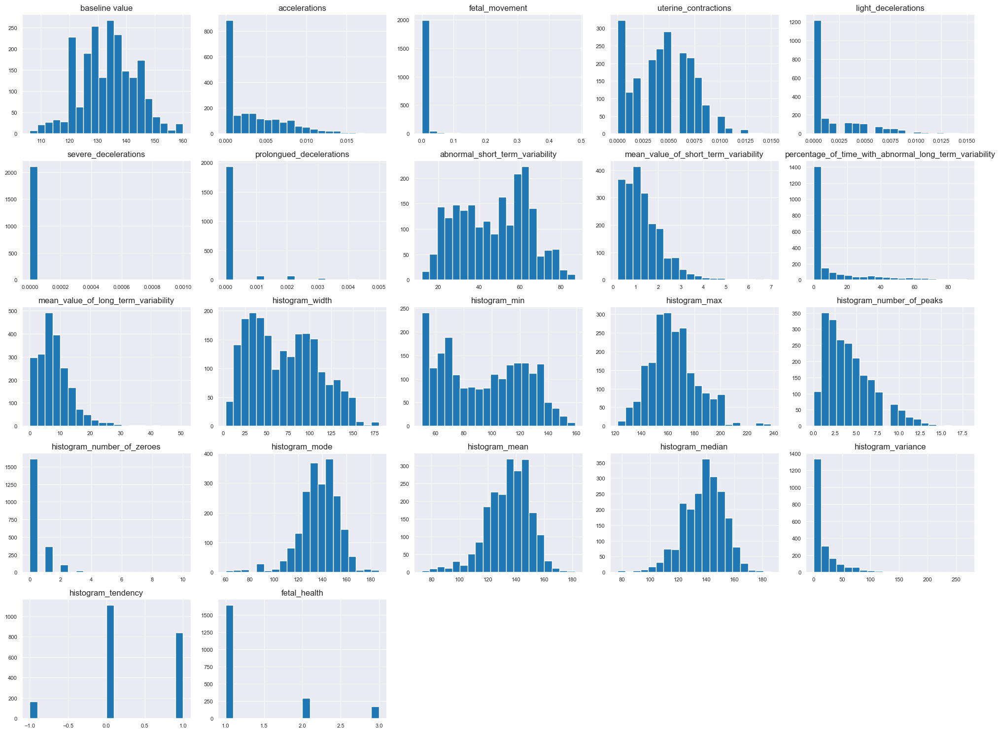

In [15]:
sns.set_style("darkgrid")
numerical_cols.hist(figsize=(20, 15), bins=20, xlabelsize=8, ylabelsize=8)
plt.tight_layout()
plt.show()

 - Baseline FHR, abnormal short term variability have a close to normal distribution
 - Histogram width, max , mean and median also have a close to normal distibution
 - Accelerations, light decelerations, percentage of time with abnormal long term variability, mean value of long term variability have a right skew
 - histogram number of peaks, and histogram variance have a strong right skew
 - Number of fetal movements per second were mostly 0 - 0.48. 
 - there were no severe decelerations noted, but there were few prolonged decelerations. 
 - Most of the fetuses were healthy (1), with a few being suspected(2), and pathological (3)
 

## Checking for outliers in the data

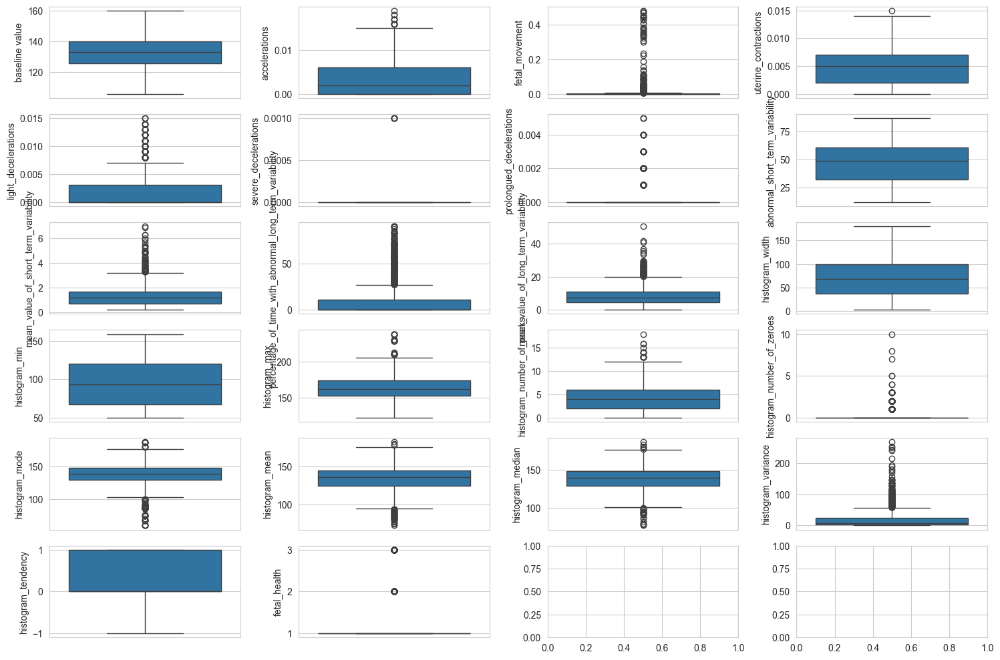

In [16]:
sns.set_style("whitegrid")
# create a box plot for each column to see outliers
columns = numerical_cols.columns.tolist()

fig, axes = plt.subplots(nrows=6, ncols=4, figsize=(15, 10))
for i, column in enumerate(columns):
    sns.boxplot(
        y=column,
        data=numerical_cols,
        ax=axes[i // 4, i % 4],
    )
plt.tight_layout()
plt.show()

## Correlation between the variables

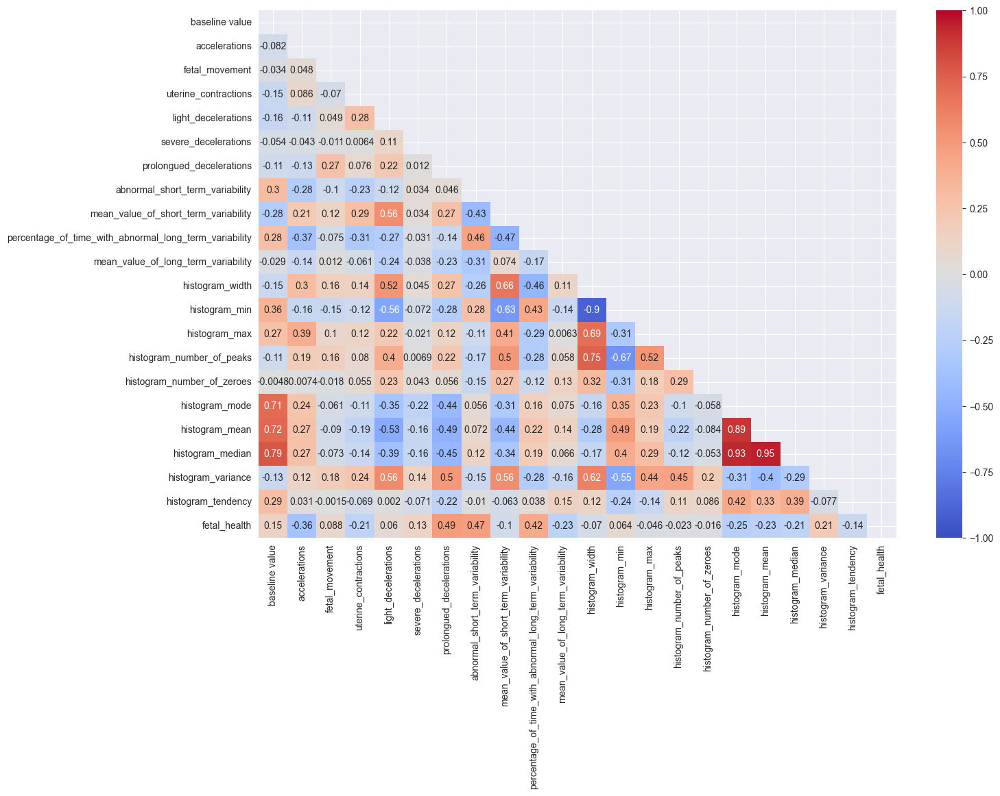

In [17]:
# find the correlation between the numerical columns
corr = numerical_cols.corr()
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True

sns.set_style("darkgrid")
plt.figure(figsize=(15, 10))
sns.heatmap(corr, mask=mask, annot=True, vmin=-1, vmax=1, cmap="coolwarm")
plt.show()

### Correlations with Fetal Health
- Not many variables correlate strongly with fetal health
- prolongued decelerations, abnormal short term variability and percentage of time with abnormal long term variability correlate moderately with fetal health
### High Positive correlation > 0.75
- histogram mean and histogram mode
- histogram median and histogram mode
- histogram median and histogram mean
- histogram number of peaks and width
- histogram median and baseline FHR

### Moderate Positive correlation 0.5 - 0.75
- histogram width with light decelerations and mean value of short term variability
- histogram max with histogram width
- histogram number of peaks with mean value of short term variability and histogram max
- histogram mode and mean with base line fhr
- histogram variace with light decelerations, prolonged decelerations, mean value of short term variability, and historgam width

### High Negative correlation < -0.75
- histogram min with hisotgram width

### Moderate negative correlation -0.5 to -0.75
- histogram with light decelerations and mean value of short term variability
- histogram number of peaks with historgram min 
- histogram mean with light decelerations
- histogram variance with histogram min 

## High positive correlation maps

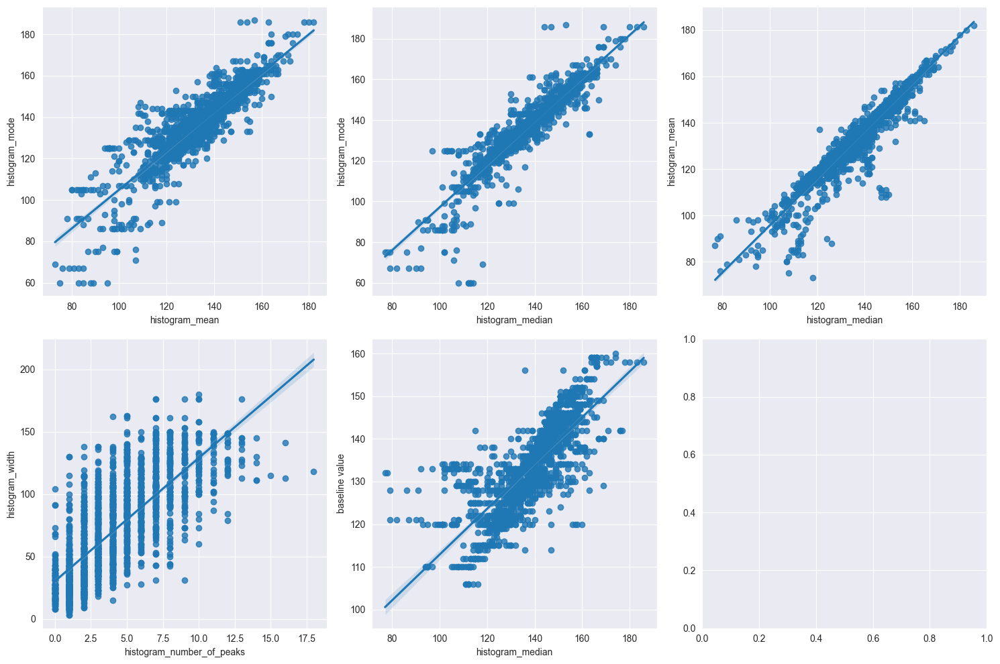

In [18]:
high_positive_correlation_pairs = [
    ("histogram_mean", "histogram_mode"),
    ("histogram_median", "histogram_mode"),
    ("histogram_median", "histogram_mean"),
    ("histogram_number_of_peaks", "histogram_width"),
    ("histogram_median", "baseline value"),
]

sns.set_style("darkgrid")
fig, ax = plt.subplots(nrows=2, ncols=3, figsize=(15, 10))

for i, pair in enumerate(high_positive_correlation_pairs):
    sns.regplot(x=pair[0], y=pair[1], data=numerical_cols, ax=ax[i // 3, i % 3])
plt.tight_layout()
plt.show()

# Moderate Positive Correlation

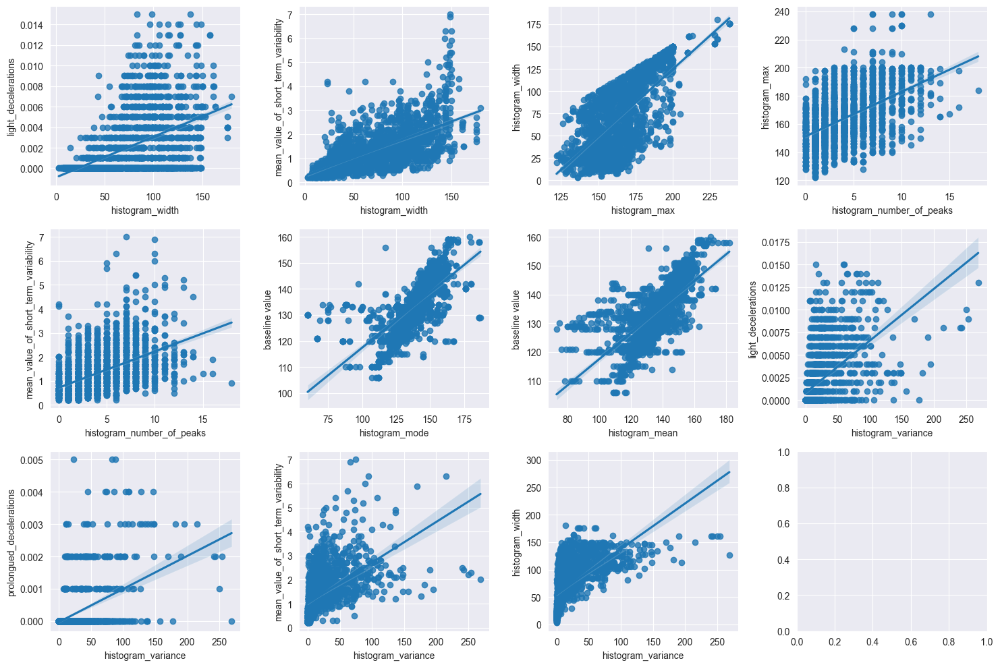

In [19]:
moderate_positive_correlation_pairs = [
    ("histogram_width", "light_decelerations"),
    ("histogram_width", "mean_value_of_short_term_variability"),
    ("histogram_max", "histogram_width"),
    ("histogram_number_of_peaks", "histogram_max"),
    ("histogram_number_of_peaks", "mean_value_of_short_term_variability"),
    ("histogram_mode", "baseline value"),
    ("histogram_mean", "baseline value"),
    ("histogram_variance", "light_decelerations"),
    ("histogram_variance", "prolongued_decelerations"),
    ("histogram_variance", "mean_value_of_short_term_variability"),
    ("histogram_variance", "histogram_width"),
]

sns.set_style("darkgrid")

fig, ax = plt.subplots(nrows=3, ncols=4, figsize=(15, 10))
for i, pair in enumerate(moderate_positive_correlation_pairs):
    sns.regplot(x=pair[0], y=pair[1], data=numerical_cols, ax=ax[i // 4, i % 4])
plt.tight_layout()
plt.show()

# High Negative Correlation

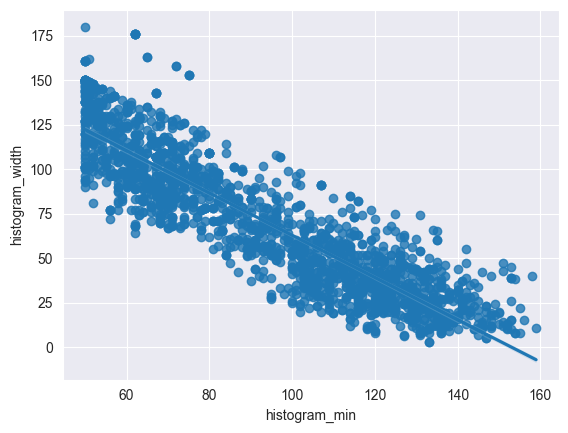

In [20]:
sns.set_style("darkgrid")
sns.regplot(x="histogram_min", y="histogram_width", data=numerical_cols)
plt.show()

## Moderate Negative Correlation

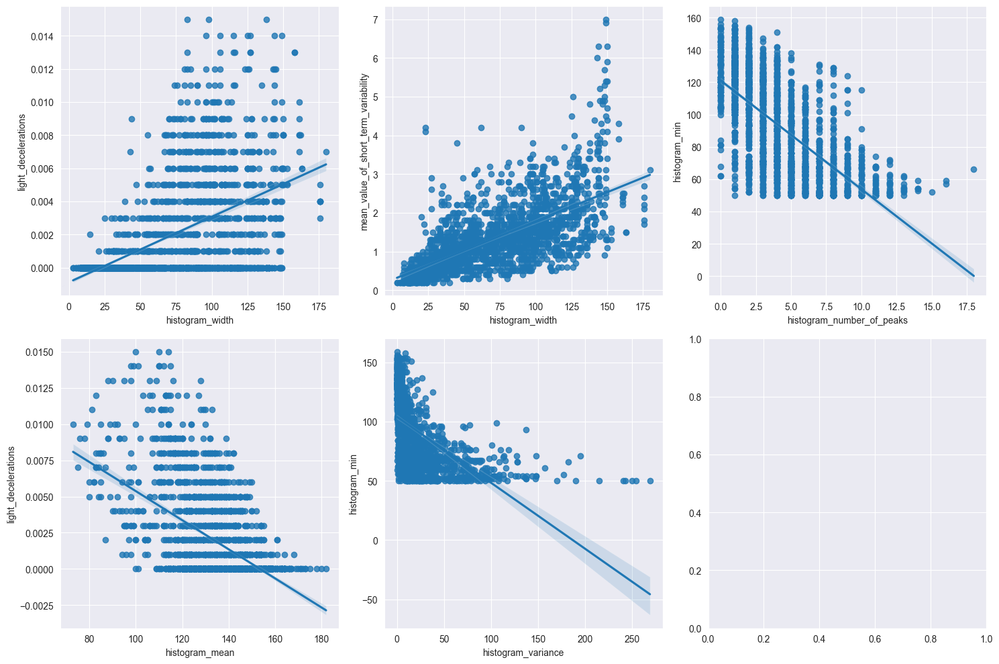

In [21]:
moderate_negative_correlation_pairs = [
    ("histogram_width", "light_decelerations"),
    ("histogram_width", "mean_value_of_short_term_variability"),
    ("histogram_number_of_peaks", "histogram_min"),
    ("histogram_mean", "light_decelerations"),
    ("histogram_variance", "histogram_min"),
]

sns.set_style("darkgrid")
fig, ax = plt.subplots(nrows=2, ncols=3, figsize=(15, 10))

for i, pair in enumerate(moderate_negative_correlation_pairs):
    sns.regplot(x=pair[0], y=pair[1], data=numerical_cols, ax=ax[i // 3, i % 3])
plt.tight_layout()
plt.show()

## Fetal health Analysis

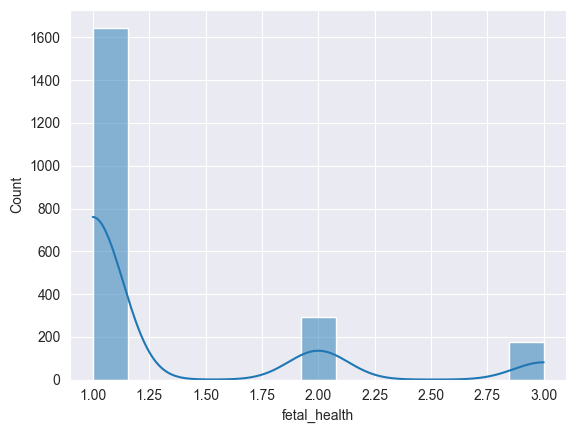

In [22]:
# plot a histogram of the target variable
sns.set_style("darkgrid")
sns.histplot(df["fetal_health"], kde=True)
plt.show()

In [23]:
pie_data = df["fetal_health"].value_counts().reset_index()

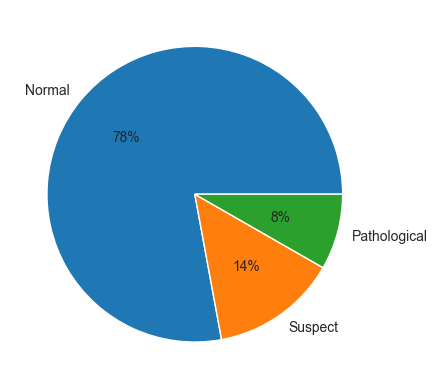

In [24]:
# bar chart with the various fetal_health values
sns.set_style("darkgrid")
plt.pie(
    pie_data["count"], labels=["Normal", "Suspect", "Pathological"], autopct="%.0f%%"
)
plt.show()

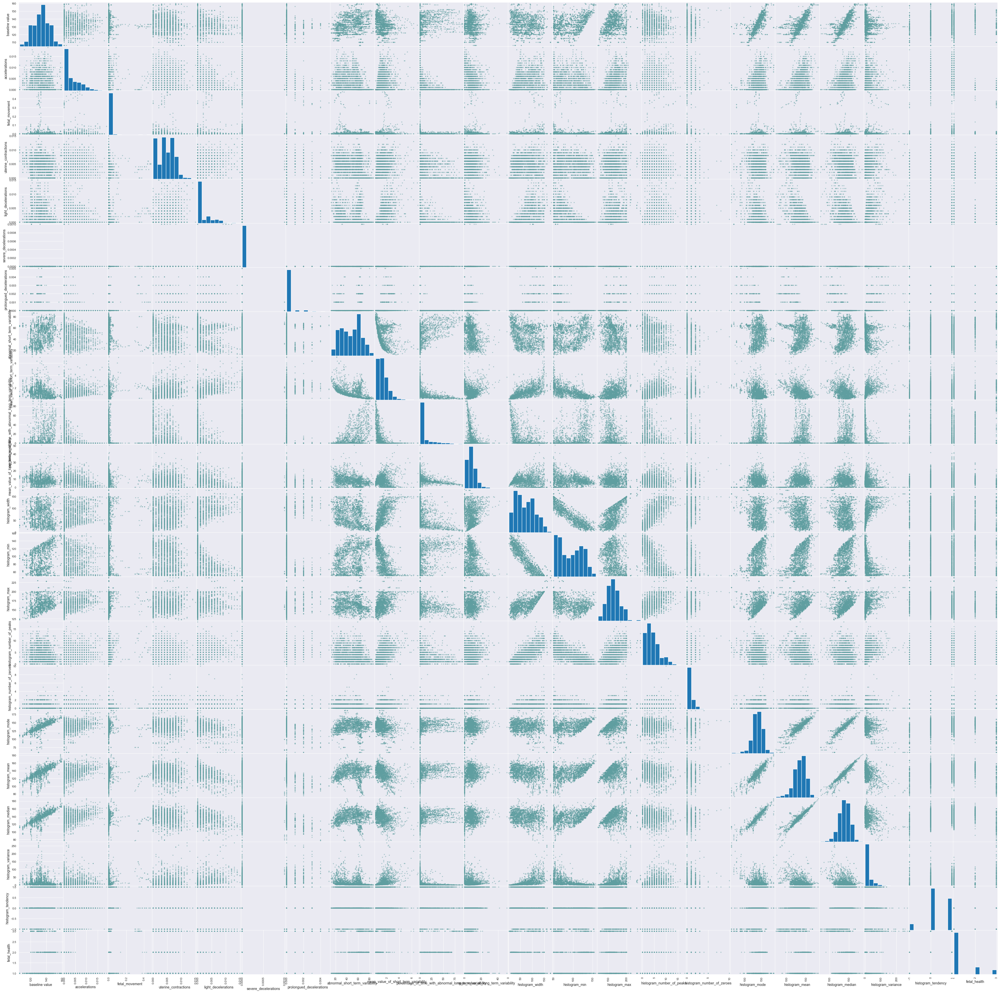

In [25]:
from pandas.plotting import scatter_matrix

scatterMatrix = scatter_matrix(df, figsize=(50, 50), color="#5F9EA0")

# Average values of Healthy Fetuses


In [26]:
df.head()

,baseline value,accelerations,fetal_movement,uterine_contractions,light_decelerations,severe_decelerations,prolongued_decelerations,abnormal_short_term_variability,mean_value_of_short_term_variability,percentage_of_time_with_abnormal_long_term_variability,...,histogram_min,histogram_max,histogram_number_of_peaks,histogram_number_of_zeroes,histogram_mode,histogram_mean,histogram_median,histogram_variance,histogram_tendency,fetal_health
0,120.0,0.000,0.0,0.000,0.000,0.0,0.0,73.0,0.5,43.0,...,62.0,126.0,2.0,0.0,120.0,137.0,121.0,73.0,1.0,2.0
1,132.0,0.006,0.0,0.006,0.003,0.0,0.0,17.0,2.1,0.0,...,68.0,198.0,6.0,1.0,141.0,136.0,140.0,12.0,0.0,1.0
2,133.0,0.003,0.0,0.008,0.003,0.0,0.0,16.0,2.1,0.0,...,68.0,198.0,5.0,1.0,141.0,135.0,138.0,13.0,0.0,1.0
3,134.0,0.003,0.0,0.008,0.003,0.0,0.0,16.0,2.4,0.0,...,53.0,170.0,11.0,0.0,137.0,134.0,137.0,13.0,1.0,1.0
4,132.0,0.007,0.0,0.008,0.000,0.0,0.0,16.0,2.4,0.0,...,53.0,170.0,9.0,0.0,137.0,136.0,138.0,11.0,1.0,1.0


In [27]:
# group the dataframe by fetal_health and aggregate the mean of the remaining columns
fetal_health_mean_values = df.groupby("fetal_health").agg("mean")
fetal_health_mean_values

,baseline value,accelerations,fetal_movement,uterine_contractions,light_decelerations,severe_decelerations,prolongued_decelerations,abnormal_short_term_variability,mean_value_of_short_term_variability,percentage_of_time_with_abnormal_long_term_variability,...,histogram_width,histogram_min,histogram_max,histogram_number_of_peaks,histogram_number_of_zeroes,histogram_mode,histogram_mean,histogram_median,histogram_variance,histogram_tendency
fetal_health,,,,,,,,,,,,,,,,,,,,,
1.0,131.998177,0.004002,0.008002,0.004801,0.001952,6.075334e-07,0.000052,42.501823,1.431713,5.059538,...,73.492102,91.073512,164.565614,4.170109,0.337181,138.286756,135.116039,138.482382,17.556501,0.341434
2.0,141.650685,0.000277,0.008284,0.002404,0.000541,0.000000e+00,0.000096,61.791096,0.642123,28.832192,...,49.250000,113.304795,162.554795,3.328767,0.246575,146.551370,144.746575,147.061644,7.277397,0.428082
3.0,131.668571,0.000394,0.025823,0.003806,0.003691,3.428571e-05,0.001280,64.554286,1.581714,22.571429,...,78.240000,84.057143,162.297143,4.451429,0.348571,114.445714,112.811429,119.422857,51.017143,-0.080000


In [28]:
clinically_useful_columns = [
    "baseline value",
    "accelerations",
    "uterine_contractions",
    "severe_decelerations",
    "prolongued_decelerations",
    "light_decelerations",
    "fetal_movement",
    "abnormal_short_term_variability",
    "mean_value_of_short_term_variability",
    "percentage_of_time_with_abnormal_long_term_variability",
]

fetal_health_mean_values = fetal_health_mean_values[clinically_useful_columns]
fetal_health_mean_values

,baseline value,accelerations,uterine_contractions,severe_decelerations,prolongued_decelerations,light_decelerations,fetal_movement,abnormal_short_term_variability,mean_value_of_short_term_variability,percentage_of_time_with_abnormal_long_term_variability
fetal_health,,,,,,,,,,
1.0,131.998177,0.004002,0.004801,6.075334e-07,0.000052,0.001952,0.008002,42.501823,1.431713,5.059538
2.0,141.650685,0.000277,0.002404,0.000000e+00,0.000096,0.000541,0.008284,61.791096,0.642123,28.832192
3.0,131.668571,0.000394,0.003806,3.428571e-05,0.001280,0.003691,0.025823,64.554286,1.581714,22.571429


In [29]:
# scale the values in each column of fetal_health_mean_values such that the maximum value is 1 and the minimum value is 0
fetal_health_mean_values = fetal_health_mean_values.apply(
    lambda x: (x - x.min()) / (x.max() - x.min())
)
fetal_health_mean_values

,baseline value,accelerations,uterine_contractions,severe_decelerations,prolongued_decelerations,light_decelerations,fetal_movement,abnormal_short_term_variability,mean_value_of_short_term_variability,percentage_of_time_with_abnormal_long_term_variability
fetal_health,,,,,,,,,,
1.0,0.03302,1.000000,1.000000,0.01772,0.000000,0.44786,0.000000,0.000000,0.840355,0.00000
2.0,1.00000,0.000000,0.000000,0.00000,0.036024,0.00000,0.015814,0.874699,0.000000,1.00000
3.0,0.00000,0.031384,0.584826,1.00000,1.000000,1.00000,1.000000,1.000000,1.000000,0.73664


In [30]:
normal_fetus = fetal_health_mean_values[fetal_health_mean_values.index == 1.0]
suspect_fetus = fetal_health_mean_values[fetal_health_mean_values.index == 2.0]
pathologic_fetus = fetal_health_mean_values[fetal_health_mean_values.index == 3.0]

In [31]:
clinically_useful_columns

['baseline value',
 'accelerations',
 'uterine_contractions',
 'severe_decelerations',
 'prolongued_decelerations',
 'light_decelerations',
 'fetal_movement',
 'abnormal_short_term_variability',
 'mean_value_of_short_term_variability',
 'percentage_of_time_with_abnormal_long_term_variability']

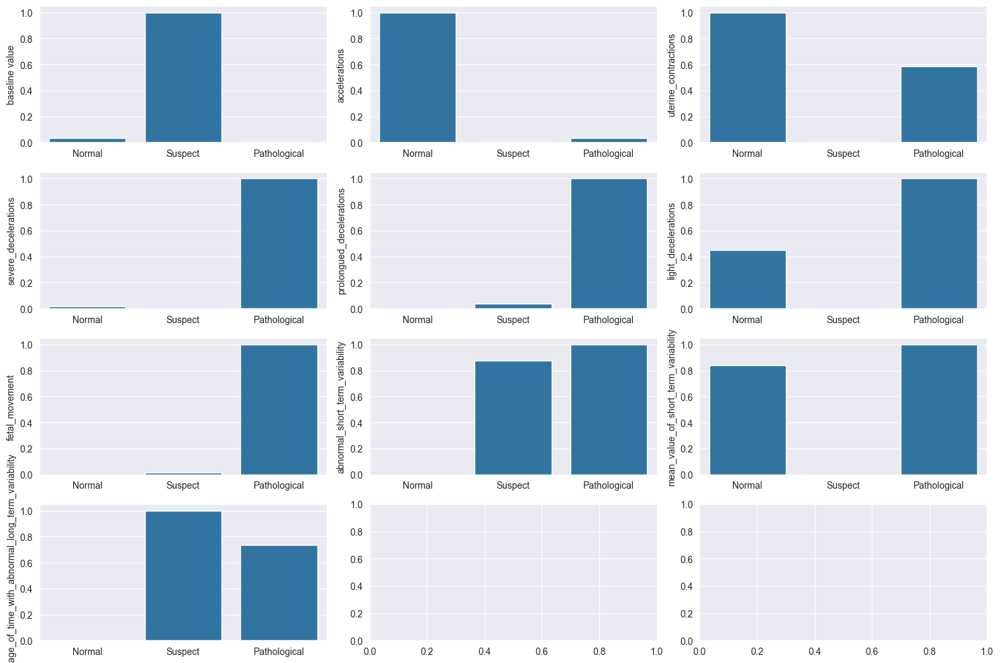

In [32]:
fig, ax = plt.subplots(nrows=4, ncols=3, figsize=(15, 10))
for i, column in enumerate(clinically_useful_columns):
    sns.barplot(
        x=["Normal", "Suspect", "Pathological"],
        y=column,
        data=fetal_health_mean_values,
        ax=ax[i // 3, i % 3],
    )
plt.tight_layout()
plt.show()

## Most Commonly associated with Normal Fetuses
- Higher mean number of Accelerations per second
- Higher mean number of Uterine contractions per second
- Some moderate amount of light decelerations
- Higher Mean value of short term variability

## Most Commonly associated with Pathological fetuses
- moderate amount of uterine contractions per second
- High number of severe decelerations
- High number of prolonged decelerations
- High number of light decelerations
- High number of fetal movement
- High number of abnormal short term variability
- High number of mean value of short term varibaility
- Moderate number of percentage of time with abnormal long term variability





# 4. Machine Learning

In [33]:
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn import linear_model
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import learning_curve
from sklearn.tree import DecisionTreeClassifier
import sklearn.tree as tree

## Data preprocessing


In [34]:
# create the features x and the target y
X = df.drop("fetal_health", axis=1)
y = df["fetal_health"]

# scale the features in x
scaler = StandardScaler()
X = scaler.fit_transform(X)

# split the data set into a training set and a test set
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

## Decision Tree

In [35]:
clf = DecisionTreeClassifier()
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)
y_pred

array([1., 1., 1., 1., 2., 2., 1., 1., 1., 1., 1., 1., 1., 1., 3., 1., 1.,
       1., 1., 1., 3., 1., 3., 1., 1., 1., 1., 1., 1., 1., 1., 1., 2., 1.,
       1., 1., 1., 1., 1., 1., 2., 1., 1., 1., 2., 1., 1., 1., 1., 1., 1.,
       2., 1., 1., 1., 2., 1., 1., 1., 1., 1., 1., 2., 1., 1., 1., 1., 2.,
       1., 2., 1., 1., 1., 3., 1., 2., 2., 1., 2., 3., 2., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 2., 3., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 3., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 2., 1., 1., 1.,
       2., 1., 1., 1., 3., 1., 1., 1., 2., 1., 1., 1., 2., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 2., 2., 1., 1., 1., 1., 1., 1., 2.,
       3., 1., 1., 1., 1., 1., 1., 1., 1., 2., 1., 1., 2., 1., 1., 1., 1.,
       2., 2., 1., 1., 2., 1., 1., 1., 2., 1., 1., 1., 1., 1., 1., 2., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 2., 1., 2., 1., 1., 1., 3., 3.,
       2., 2., 1., 1., 1., 1., 1., 1., 1., 1., 3., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1.

DecisionTrees's Accuracy:  0.933806146572104


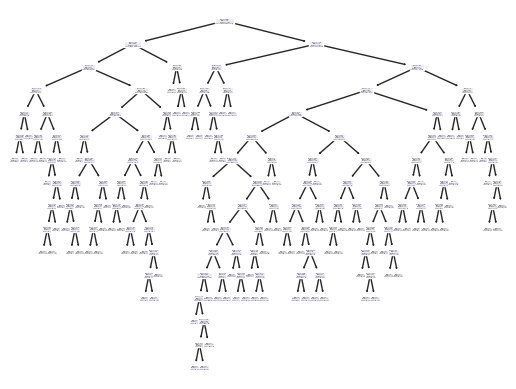

In [36]:
from sklearn import metrics

print("DecisionTrees's Accuracy: ", metrics.accuracy_score(y_test, y_pred))

tree.plot_tree(clf)
plt.show()

## Logistic Regression

In [37]:
logistic_regression = LogisticRegression()
logistic_regression_model = logistic_regression.fit(X_train, y_train)
print(
    f"Baseline Logisitic regression accuracy: {round(logistic_regression_model.score(X_test, y_test), 3)}"
)

Baseline Logisitic regression accuracy: 0.915


In [38]:
cv_method = StratifiedKFold(n_splits=3, random_state=42, shuffle=True)

scoring_metric = "accuracy"
scores_logistic = cross_val_score(
    logistic_regression, X_train, y_train, cv=cv_method, scoring=scoring_metric
)
print(f"Scores(Cross validate) for Logistic Regression model:\n{scores_logistic}")
print(f"CrossValMeans: {round(scores_logistic.mean(), 3)}")
print(f"CrossValStandard Deviation: {round(scores_logistic.std(), 3)}")

Scores(Cross validate) for Logistic Regression model:
[0.89007092 0.89165187 0.87744227]
CrossValMeans: 0.886
CrossValStandard Deviation: 0.006


In [39]:
params_LR = {
    "tol": [0.0001, 0.0002, 0.0003],
    "C": [0.01, 0.1, 1, 10, 100],
    "intercept_scaling": [1, 2, 3, 4],
}

GridSearchCV_LR = GridSearchCV(
    LogisticRegression(),
    param_grid=params_LR,
    cv=cv_method,
    scoring=scoring_metric,
    verbose=1,
    n_jobs=2,
    return_train_score=True,
)

In [40]:
import warnings

warnings.simplefilter(action="ignore")
warnings.filterwarnings("ignore")

In [41]:
GridSearchCV_LR.fit(X_train, y_train)
best_estimator_LR = GridSearchCV_LR.best_estimator_

Fitting 3 folds for each of 60 candidates, totalling 180 fits


/Users/mohammed-sherriffuseini/Documents/1. Projects/Code/fetal-wellbeing-classification/.env/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/mohammed-sherriffuseini/Documents/1. Projects/Code/fetal-wellbeing-classification/.env/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Pl

In [42]:
print(f"Best estimator for LR model: \n{best_estimator_LR}")
print(f"GridSearchCV Logistic Regression Best Score: {GridSearchCV_LR.best_score_}")
print(f"GridSearchCV Logistic Regression Best Params: {GridSearchCV_LR.best_params_}")

Best estimator for LR model: 
LogisticRegression(C=1)
GridSearchCV Logistic Regression Best Score: 0.8863883535097775
GridSearchCV Logistic Regression Best Params: {'C': 1, 'intercept_scaling': 1, 'tol': 0.0001}


In [43]:
# the best parameters from the grid search was:
logistic_regression = LogisticRegression(
    C=1,
    intercept_scaling=1,
    tol=0.0001,
    solver="liblinear",
    random_state=42,
)
logistic_regression_model = logistic_regression.fit(X_train, y_train)
y_pred_LR = logistic_regression_model.predict(X_test)

mse_logistic_regression = mean_squared_error(y_test, y_pred_LR)
rmse_logistic_regression = np.sqrt(mse_logistic_regression)
scores_logistic_regression_train = logistic_regression_model.score(X_train, y_train)
scores_logistic_regression_test = logistic_regression_model.score(X_test, y_test)


print(f"Mean Squared Error: {round(mse_logistic_regression, 3)}")
print(
    f"Root mean square error for logisitic regression = {round(mse_logistic_regression, 3)}"
)
print(
    f"R^2 coefficient of determination on training set = {round(scores_logistic_regression_train, 3)}"
)
print(
    f"R^2 coefficient of determination on testing set = {round(scores_logistic_regression_test, 3)}"
)

Mean Squared Error: 0.099
Root mean square error for logisitic regression = 0.099
R^2 coefficient of determination on training set = 0.893
R^2 coefficient of determination on testing set = 0.922


In [44]:
print(
    "Classification Report for Logistic Regression model:\n",
    classification_report(y_test, y_pred_LR),
)

Classification Report for Logistic Regression model:
               precision    recall  f1-score   support

         1.0       0.94      0.98      0.96       341
         2.0       0.80      0.59      0.68        54
         3.0       0.92      0.86      0.89        28

    accuracy                           0.92       423
   macro avg       0.89      0.81      0.84       423
weighted avg       0.92      0.92      0.92       423



In [45]:
print("Confusion matrix: \n", confusion_matrix(y_test, y_pred_LR))

Confusion matrix: 
 [[334   7   0]
 [ 20  32   2]
 [  3   1  24]]


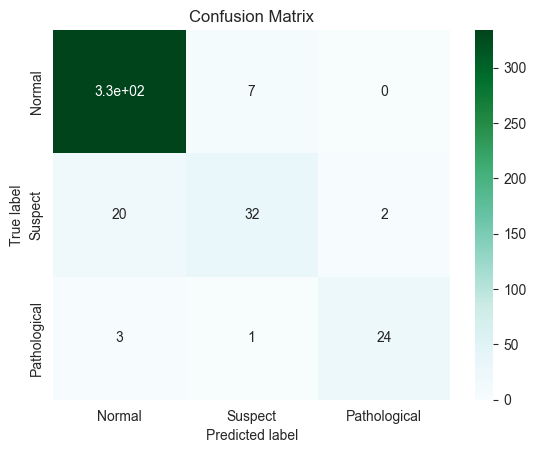

In [46]:
ax = plt.subplot()
sns.heatmap(confusion_matrix(y_test, y_pred_LR), annot=True, ax=ax, cmap="BuGn")

# labels, title and ticks
ax.set_xlabel("Predicted label")
ax.set_ylabel("True label")
ax.set_title("Confusion Matrix")
ax.xaxis.set_ticklabels(["Normal", "Suspect", "Pathological"])
ax.yaxis.set_ticklabels(["Normal", "Suspect", "Pathological"])

plt.show()

In [47]:
def calculate_errors(y_test, y_pred):
    mse_model = mean_squared_error(y_test, y_pred)
    rmse_model = np.sqrt(mse_model)
    print(f"Mean Squared Error: {round(mse_model, 3)}")
    print(f"Root mean square error for logisitic regression = {round(rmse_model, 3)}")
    return True


def calculate_R2(model, X_train, y_train, X_test, y_test):
    scores_model_train = model.score(X_train, y_train)
    print(
        f"R^2 coefficient of determination on training set = {round(scores_model_train, 3)}"
    )
    scores_model_test = model.score(X_test, y_test)
    print(
        f"R^2 coefficient of determination on test set = {round(scores_model_test, 3)}"
    )

    return True


def plot_confusion_matrix(y_test, y_pred):
    # print classification report
    print(
        "Classification Report for Logistic Regression model:\n",
        classification_report(y_test, y_pred),
    )

    # print confusion matrix
    print("Confusion matrix: \n", confusion_matrix(y_test, y_pred))

    # plot confusion matrix as a heatmap
    ax = plt.subplot()
    sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, ax=ax, cmap="BuGn")

    # labels, title and ticks
    ax.set_xlabel("Predicted label")
    ax.set_ylabel("True label")
    ax.set_title("Confusion Matrix")
    ax.xaxis.set_ticklabels(["Normal", "Suspect", "Pathological"])
    ax.yaxis.set_ticklabels(["Normal", "Suspect", "Pathological"])

    plt.show()
    return True


def evaluate_model(model, X_train, y_train, X_test, y_test, y_pred):
    calculate_errors(y_test, y_pred)
    calculate_R2(model, X_train, y_train, X_test, y_test)
    plot_confusion_matrix(y_test, y_pred)
    return True

Mean Squared Error: 0.099
Root mean square error for logisitic regression = 0.315
R^2 coefficient of determination on training set = 0.893
R^2 coefficient of determination on test set = 0.922
Classification Report for Logistic Regression model:
               precision    recall  f1-score   support

         1.0       0.94      0.98      0.96       341
         2.0       0.80      0.59      0.68        54
         3.0       0.92      0.86      0.89        28

    accuracy                           0.92       423
   macro avg       0.89      0.81      0.84       423
weighted avg       0.92      0.92      0.92       423

Confusion matrix: 
 [[334   7   0]
 [ 20  32   2]
 [  3   1  24]]


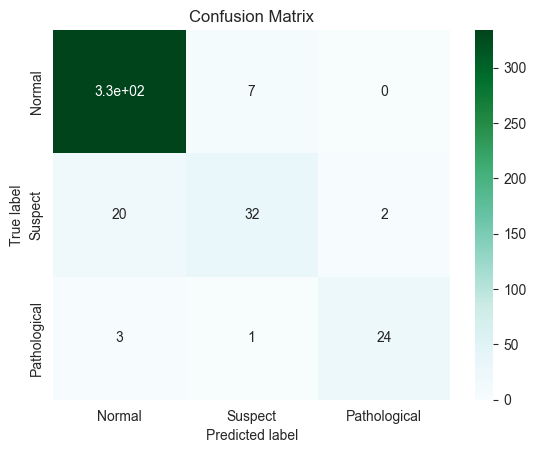

True

In [48]:
evaluate_model(logistic_regression_model, X_train, y_train, X_test, y_test, y_pred_LR)

# K-Nearest Neighbors (KNN)

In [49]:
knn = KNeighborsClassifier()
knn_model = knn.fit(X_train, y_train)
print(f"Baseline accuracy of Knn: {round(knn_model.score(X_test, y_test), 3)}")

y_pred_knn = knn_model.predict(X_test)

Baseline accuracy of Knn: 0.91


In [50]:
scoring_metric = "accuracy"
cv_method = StratifiedKFold(n_splits=3, random_state=42, shuffle=True)
scores_knn = cross_val_score(
    knn, X_train, y_train, cv=cv_method, n_jobs=2, scoring=scoring_metric
)

In [51]:
print(f"Scores(Cross validate) for K-Nearest Neighbors model: \n {scores_knn}")
print(f"CrossVal Means: {round(scores_knn.mean(), 3)}")
print(f"CrossVal Standard deviation: {round(scores_knn.std(), 3)}")

Scores(Cross validate) for K-Nearest Neighbors model: 
 [0.89184397 0.89875666 0.86500888]
CrossVal Means: 0.885
CrossVal Standard deviation: 0.015


In [52]:
# tuning the hyperparameters
params_knn = {
    "leaf_size": list(range(1, 30)),
    "n_neighbors": list(range(1, 21)),
    "p": [1, 2],
}

GridSearchCV_Knn = GridSearchCV(
    knn,
    param_grid=params_knn,
    cv=cv_method,
    scoring=scoring_metric,
    verbose=1,
    n_jobs=2,
    return_train_score=True,
)
GridSearchCV_Knn.fit(X_train, y_train)
best_estimator_Knn = GridSearchCV_Knn.best_estimator_
print(f"Best estimator for Knn model: \n{best_estimator_Knn}")
print(f"GridSearchCV Knn Best Score: {GridSearchCV_Knn.best_score_}")
print(f"GridSearchCV Knn Best Params: {GridSearchCV_Knn.best_params_}")

Fitting 3 folds for each of 1160 candidates, totalling 3480 fits
Best estimator for Knn model: 
KNeighborsClassifier(leaf_size=1, n_neighbors=1, p=1)
GridSearchCV Knn Best Score: 0.9094663424998636
GridSearchCV Knn Best Params: {'leaf_size': 1, 'n_neighbors': 1, 'p': 1}


Mean Squared Error: 0.118
Root mean square error for logisitic regression = 0.344
R^2 coefficient of determination on training set = 0.999
R^2 coefficient of determination on test set = 0.917
Classification Report for Logistic Regression model:
               precision    recall  f1-score   support

         1.0       0.95      0.96      0.96       341
         2.0       0.75      0.67      0.71        54
         3.0       0.85      0.82      0.84        28

    accuracy                           0.92       423
   macro avg       0.85      0.82      0.83       423
weighted avg       0.91      0.92      0.92       423

Confusion matrix: 
 [[329  11   1]
 [ 15  36   3]
 [  4   1  23]]


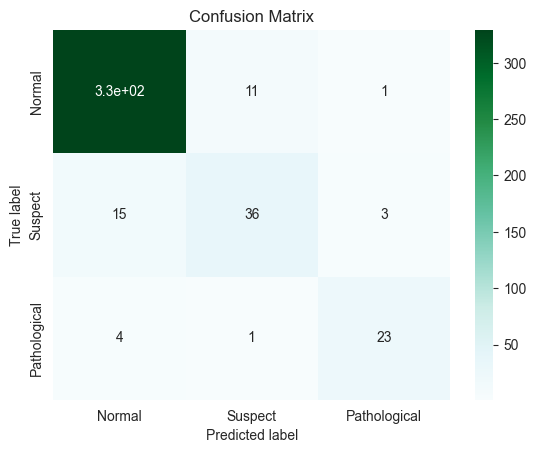

True

In [53]:
knn = KNeighborsClassifier(leaf_size=1, n_neighbors=1, p=1)
knn_model = knn.fit(X_train, y_train)
y_pred_knn = knn_model.predict(X_test)

# EVALUATE THE MODEL
evaluate_model(knn_model, X_train, y_train, X_test, y_test, y_pred_knn)

## Random Forest Classification

In [54]:
random_forest = RandomForestClassifier()
random_forest_model = random_forest.fit(X_train, y_train)

y_pred_random_forest = random_forest_model.predict(X_test)
print(
    f"Baseline accuracy of Random Forest: {round(random_forest_model.score(X_test, y_test), 3)}"
)

Baseline accuracy of Random Forest: 0.967


In [55]:
# cross validate random forest model
scores_rf = cross_val_score(
    random_forest, X_train, y_train, cv=cv_method, n_jobs=2, scoring=scoring_metric
)

print(f"scores(Cross Validate) for Random Forest model: \n {scores_rf}")
print(f"CrossVal Means: {round(scores_rf.mean(), 3)}")
print(f"CrossVal Standard deviation: {round(scores_rf.std(), 3)}")

scores(Cross Validate) for Random Forest model: 
 [0.92907801 0.93605684 0.92184725]
CrossVal Means: 0.929
CrossVal Standard deviation: 0.006


In [56]:
params_rf = {
    "criterion": ["gini"],
    "min_samples_leaf": [1, 4, 8, 16],
    "min_samples_split": [2, 6, 20],
    "n_estimators": [100, 200, 300, 400],
}

In [57]:
GridSearchCV_RF = GridSearchCV(
    estimator=random_forest,
    param_grid=params_rf,
    cv=cv_method,
    n_jobs=2,
    verbose=1,
    scoring=scoring_metric,
    return_train_score=True,
)

GridSearchCV_RF.fit(X_train, y_train)

Fitting 3 folds for each of 48 candidates, totalling 144 fits


GridSearchCV(cv=StratifiedKFold(n_splits=3, random_state=42, shuffle=True),
             estimator=RandomForestClassifier(), n_jobs=2,
             param_grid={'criterion': ['gini'],
                         'min_samples_leaf': [1, 4, 8, 16],
                         'min_samples_split': [2, 6, 20],
                         'n_estimators': [100, 200, 300, 400]},
             return_train_score=True, scoring='accuracy', verbose=1)

In [58]:
best_estimator_rf = GridSearchCV_RF.best_estimator_
print(f"Best estimator for Random Forest model is: \n {best_estimator_rf}")

Best estimator for Random Forest model is: 
 RandomForestClassifier(n_estimators=400)


In [59]:
best_params_rf = GridSearchCV_RF.best_params_

print(f"GridSearchCV Random Forest Best Score: {GridSearchCV_RF.best_score_}")
print(f"GridSearchCV Random Forest Best Params: {best_params_rf}")

GridSearchCV Random Forest Best Score: 0.9266289171904983
GridSearchCV Random Forest Best Params: {'criterion': 'gini', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 400}


In [60]:
random_forest = RandomForestClassifier(
    criterion="gini",
    min_samples_leaf=1,
    min_samples_split=6,
    n_estimators=400,
    random_state=42,
)

random_forest_model = random_forest.fit(X_train, y_train)
y_pred_random_forest = random_forest_model.predict(X_test)

Mean Squared Error: 0.033
Root mean square error for logisitic regression = 0.182
R^2 coefficient of determination on training set = 0.991
R^2 coefficient of determination on test set = 0.967
Classification Report for Logistic Regression model:
               precision    recall  f1-score   support

         1.0       0.97      0.99      0.98       341
         2.0       0.93      0.80      0.86        54
         3.0       1.00      1.00      1.00        28

    accuracy                           0.97       423
   macro avg       0.97      0.93      0.95       423
weighted avg       0.97      0.97      0.97       423

Confusion matrix: 
 [[338   3   0]
 [ 11  43   0]
 [  0   0  28]]


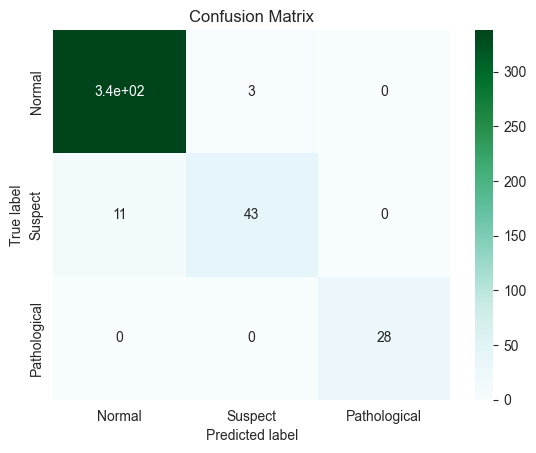

True

In [61]:
evaluate_model(
    random_forest_model, X_train, y_train, X_test, y_test, y_pred_random_forest
)

## Gradient Boost Classifier

In [62]:
gbc = GradientBoostingClassifier()
gbc_model = gbc.fit(X_train, y_train)

y_pred_gbc = gbc_model.predict(X_test)
print(
    f"Baseline accuracy of Gradient Boosting Classifier: {round(gbc_model.score(X_test, y_test), 3)}"
)

Baseline accuracy of Gradient Boosting Classifier: 0.957


In [67]:
scores_gbc = cross_val_score(
    gbc, X_train, y_train, cv=cv_method, n_jobs=2, scoring=scoring_metric
)

print(f"scores(Cross Validate) for Gradient Boosting Classifier model: \n {scores_gbc}")
print(f"CrossVal Means: {round(scores_gbc.mean(), 3)}")
print(f"CrossVal Standard deviation: {round(scores_gbc.std(), 3)}")

scores(Cross Validate) for Gradient Boosting Classifier model: 
 [0.93439716 0.93783304 0.93960924]
CrossVal Means: 0.937
CrossVal Standard deviation: 0.002


In [81]:
params_gbc = {
    "loss": ["log_loss", "exponential", "deviance"],
    "learning_rate": [0.05, 0.075, 0.1, 0.25, 0.5, 0.75, 1],
    "n_estimators": [250, 500],
    "max_depth": [3, 5, 8],
}

In [82]:
GridSearchCV_gbc = GridSearchCV(
    gbc,
    param_grid=params_gbc,
    cv=cv_method,
    n_jobs=2,
    scoring=scoring_metric,
    return_train_score=True,
    verbose=1,
)

In [83]:
GridSearchCV_gbc.fit(X_train, y_train)

Fitting 3 folds for each of 126 candidates, totalling 378 fits


GridSearchCV(cv=StratifiedKFold(n_splits=3, random_state=42, shuffle=True),
             estimator=GradientBoostingClassifier(), n_jobs=2,
             param_grid={'learning_rate': [0.05, 0.075, 0.1, 0.25, 0.5, 0.75,
                                           1],
                         'loss': ['log_loss', 'exponential', 'deviance'],
                         'max_depth': [3, 5, 8], 'n_estimators': [250, 500]},
             return_train_score=True, scoring='accuracy', verbose=1)

In [84]:
best_estimator_gbc = GridSearchCV_gbc.best_estimator_
best_params_gbc = GridSearchCV_gbc.best_params_
best_score_gbc = GridSearchCV_gbc.best_score_

print(f"Best estimator for GBC was: \n {best_estimator_gbc}")
print(f"Best params for gBc : \n {best_params_gbc}")
print(f"best Score for GBC : \n {best_score_gbc}")

Best estimator for GBC was: 
 GradientBoostingClassifier(learning_rate=1, max_depth=5, n_estimators=500)
Best params for gBc : 
 {'learning_rate': 1, 'loss': 'log_loss', 'max_depth': 5, 'n_estimators': 500}
best Score for GBC : 
 0.937275613166547


In [85]:
y_pred_gbc = best_estimator_gbc.predict(X_test)

Mean Squared Error: 0.038
Root mean square error for logisitic regression = 0.194
R^2 coefficient of determination on training set = 0.999
R^2 coefficient of determination on test set = 0.969
Classification Report for Logistic Regression model:
               precision    recall  f1-score   support

         1.0       0.98      0.99      0.98       341
         2.0       0.92      0.85      0.88        54
         3.0       0.97      1.00      0.98        28

    accuracy                           0.97       423
   macro avg       0.95      0.95      0.95       423
weighted avg       0.97      0.97      0.97       423

Confusion matrix: 
 [[336   4   1]
 [  8  46   0]
 [  0   0  28]]


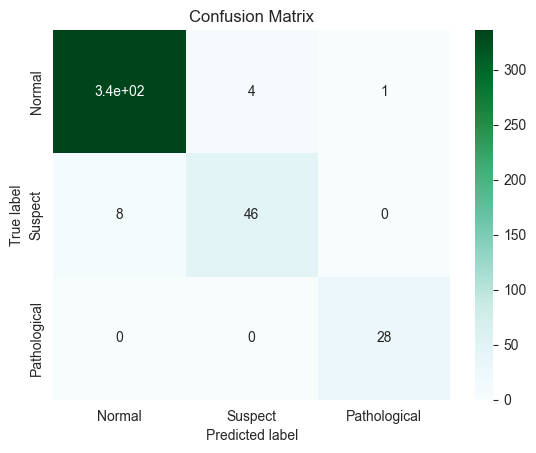

True

In [86]:
evaluate_model(best_estimator_gbc, X_train, y_train, X_test, y_test, y_pred_gbc)

# learning curves of the various models

In [87]:
# plot learning curve of the various models
def plot_learning_curve(
    estimator,
    title,
    x,
    y,
    ylim=None,
    cv=None,
    n_jobs=1,
    train_sizes=np.linspace(0.1, 1.0, 5),
):
    plt.figure()
    plt.title(title)
    if ylim is not None:
        plt.ylim(*ylim)
    plt.xlabel("Training examples")
    plt.ylabel("Score")
    train_sizes, train_scores, test_scores = learning_curve(
        estimator, x, y, cv=cv, n_jobs=n_jobs, train_sizes=train_sizes
    )
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)
    plt.grid()

    plt.fill_between(
        train_sizes,
        train_scores_mean - train_scores_std,
        train_scores_mean + train_scores_std,
        alpha=0.1,
        color="r",
    )
    plt.fill_between(
        train_sizes,
        test_scores_mean - test_scores_std,
        test_scores_mean + test_scores_std,
        alpha=0.1,
        color="g",
    )
    plt.plot(
        train_sizes, train_scores_mean, "o-", color="#80CBC4", label="Training score"
    )
    plt.plot(
        train_sizes,
        test_scores_mean,
        "o-",
        color="#00897B",
        label="Cross-validation score",
    )

    plt.legend(loc="best")
    return plt

<module 'matplotlib.pyplot' from '/Users/mohammed-sherriffuseini/Documents/1. Projects/Code/fetal-wellbeing-classification/.env/lib/python3.11/site-packages/matplotlib/pyplot.py'>

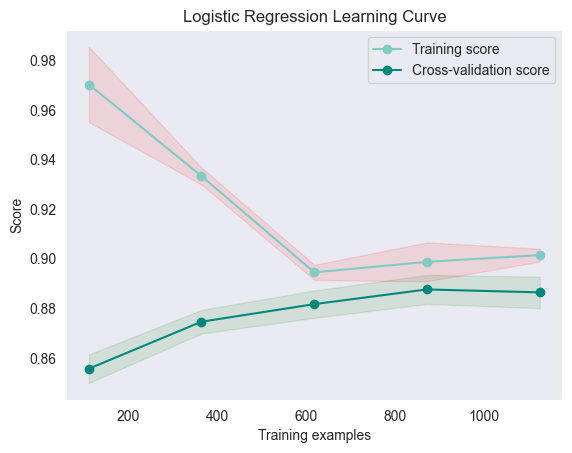

In [88]:
# Logistic Regression Learning Curve
plot_learning_curve(
    GridSearchCV_LR.best_estimator_,
    title="Logistic Regression Learning Curve",
    x=X_train,
    y=y_train,
    cv=cv_method,
)

<module 'matplotlib.pyplot' from '/Users/mohammed-sherriffuseini/Documents/1. Projects/Code/fetal-wellbeing-classification/.env/lib/python3.11/site-packages/matplotlib/pyplot.py'>

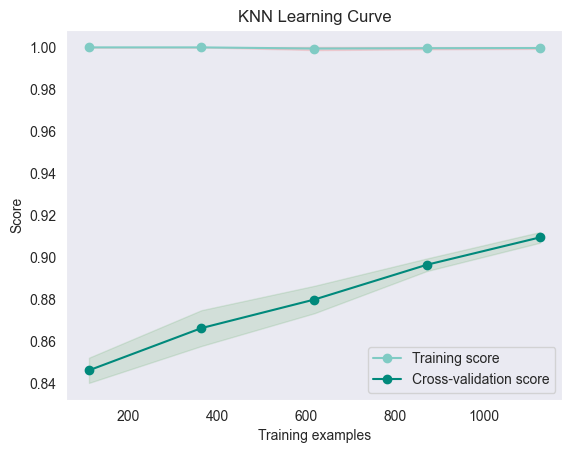

In [89]:
# learning curve for knn classifier
plot_learning_curve(
    GridSearchCV_Knn.best_estimator_,
    title="KNN Learning Curve",
    x=X_train,
    y=y_train,
    cv=cv_method,
)

<module 'matplotlib.pyplot' from '/Users/mohammed-sherriffuseini/Documents/1. Projects/Code/fetal-wellbeing-classification/.env/lib/python3.11/site-packages/matplotlib/pyplot.py'>

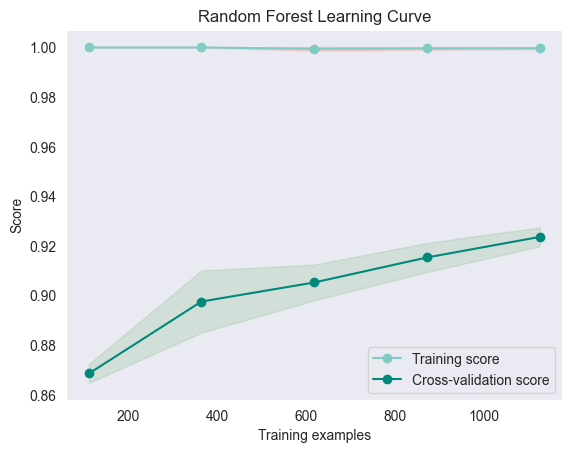

In [90]:
# Learning curve for random forest model
plot_learning_curve(
    best_estimator_rf,
    title="Random Forest Learning Curve",
    x=X_train,
    y=y_train,
    cv=cv_method,
)

<module 'matplotlib.pyplot' from '/Users/mohammed-sherriffuseini/Documents/1. Projects/Code/fetal-wellbeing-classification/.env/lib/python3.11/site-packages/matplotlib/pyplot.py'>

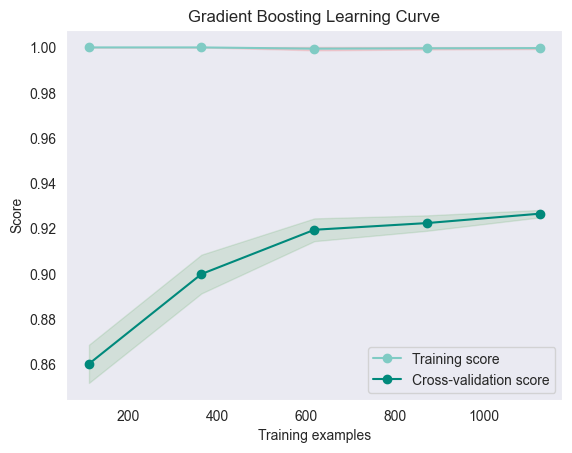

In [91]:
# learning curve for GBC
plot_learning_curve(
    best_estimator_gbc,
    title="Gradient Boosting Learning Curve",
    x=X_train,
    y=y_train,
    cv=cv_method,
)

# Model Selection

In [98]:
results = pd.DataFrame(
    {
        "Model": ["Logistic Regression", "KNN", "Random Forest", "Gradient Boosting"],
        "score": [
            logistic_regression_model.score(X_train, y_train),
            knn_model.score(X_train, y_train),
            random_forest_model.score(X_train, y_train),
            best_estimator_gbc.score(X_train, y_train),
        ],
    }
)

results_df = results.sort_values(by="score", ascending=False)
results_df = results_df.set_index("score")
results_df.head()

,Model
score,
0.999408,KNN
0.999408,Gradient Boosting
0.991124,Random Forest
0.892899,Logistic Regression


# Deep Learning with tensorflow

In [103]:
import tensorflow as tf

In [111]:
deep_learning_model = tf.keras.Sequential(
    [
        tf.keras.layers.Dense(128, activation="relu"),
        tf.keras.layers.Dense(64, activation="relu"),
        tf.keras.layers.Dense(8, activation="relu"),
        tf.keras.layers.Dense(1, activation="softmax"),
    ]
)
deep_learning_model.compile(
    optimizer=tf.keras.optimizers.Adam(0.01),
    loss=tf.keras.losses.categorical_crossentropy,
    metrics=["accuracy"],
)

In [112]:
deep_learning_model.fit(
    X_train,
    y_train,
    epochs=50,
    validation_data=(X_test, y_test),
    callbacks=[
        tf.keras.callbacks.ModelCheckpoint(
            filepath="checkpoint.model.keras",
            verbose=0,
            save_best_only=True,
        )
    ],
)

Epoch 1/50


53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.7577 - loss: 0.0000e+00 - val_accuracy: 0.8061 - val_loss: 0.0000e+00
Epoch 2/50
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 874us/step - accuracy: 0.7881 - loss: 0.0000e+00 - val_accuracy: 0.8061 - val_loss: 0.0000e+00
Epoch 3/50
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 747us/step - accuracy: 0.7878 - loss: 0.0000e+00 - val_accuracy: 0.8061 - val_loss: 0.0000e+00
Epoch 4/50
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 726us/step - accuracy: 0.7783 - loss: 0.0000e+00 - val_accuracy: 0.8061 - val_loss: 0.0000e+00
Epoch 5/50
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 741us/step - accuracy: 0.7868 - loss: 0.0000e+00 - val_accuracy: 0.8061 - val_loss: 0.0000e+00
Epoch 6/50
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7643 - loss: 0.0000e+00 - val_accuracy: 0.8061 - val_loss: 0.0000e+00
Epoch 7/50
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 723us/step - accuracy: 0.7622 - loss: 0.0000e+00 - val_accuracy: 0.8061 - val_loss: 0.0000e+00
Epoch 8/50
53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 749us/step - accuracy:

In [113]:
deep_learning_model.evaluate(X_test, y_test)

14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 418us/step - accuracy: 0.8148 - loss: 0.0000e+00


[0.0, 0.8061465620994568]

In [115]:
y_pred_DL = deep_learning_model.predict(X_test)
y_pred_DL[:10]

14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 503us/step


array([[1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.]], dtype=float32)